In [6]:
from streeteasy_scrape import *
%matplotlib inline
#import mpld3
#mpld3.enable_notebook()

import matplotlib
import numpy as np
import matplotlib.pyplot as plt


In [7]:
fulldata = util.pickle_load('data/SE_fulldata_wStationDistances_9-15.pkl')
subwayStations = util.pickle_load('subwaydata/NYCsubway_network.pkl')


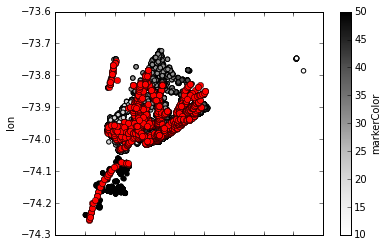

In [8]:
def prepPlot(df):
    df['lon'] = df['geoObj'].apply(lambda x: x.longitude)
    df['lat'] = df['geoObj'].apply(lambda x: x.latitude)
    df['markerColor'] = df['addressToQuery'].apply(lambda x: boroughToPt(x.split(',')[-2].lstrip()))
fulldata.plot(kind='scatter', x='lat', y='lon', c='markerColor')
for station in subwayStations['stations']:
    plt.plot(station['latitude'], station['longitude'], 'ro')


In [9]:
stationColumns = map(lambda x: x['name'] + '_distance', subwayStations['stations'])
fulldata['nearestStation'] = fulldata[stationColumns].idxmin(axis=1)

element = 4
print(fulldata.loc[element,['addressToQuery','nearestStation']])
test = fulldata[stationColumns]
new_columns = test.columns[test.iloc[element].argsort()]
#new_columns = stationColumns[fulldata.iloc[1][stationColumns].argsort()]
test[new_columns]

addressToQuery                    131 Fifth Avenue ,  Manhattan, NY
nearestStation    Broadway & 22nd St At Nw Corner (Downtown Only...
Name: 4, dtype: object


,Broadway & 22nd St At Nw Corner (Downtown Only)_distance,Broadway & 22nd St At Ne Corner (Uptown Only)_distance,5th Ave & 22nd St At Ne Corner (Downtown Only)_distance,Broadway & 23rd St At Se Corner (Uptown Only)_distance,Broadway & 23rd St At Se Corner (Uptown Only)_distance,Broadway & 23rd St At Se Corner (Uptown Only)_distance,Broadway & 23rd St At Se Corner (Uptown Only)_distance,Broadway & 23rd St At Ne Corner (Uptown Only)_distance,Broadway & 23rd St At Ne Corner (Uptown Only)_distance,Broadway & 23rd St At Ne Corner (Uptown Only)_distance,...,Weiner St & Richmond Valley Rd At Sw Corner_distance,Richmond Valley Rd & Richmond Valley Rd At Se Corner_distance,Richmond Valley Rd & Amboy Rd At Ne Corner_distance,Nassau Pl & Averill Pl At Sw Corner_distance,Bethel Av & St Andrew's Pl At Nw Corner_distance,& Ellis St At S Corner_distance,Tracy Av & Arthur Kill Rd At Nw Corner_distance,Main St & Ellis St At Sw Corner_distance,Main St & Utah St At Nw Corner_distance,7 Bentley Street_distance
0,16.916419,16.911946,16.864172,16.854439,16.854439,16.854439,16.854439,16.815271,16.815271,16.815271,...,48.278551,48.323612,48.330788,48.934085,48.949129,49.455269,49.465902,49.923621,49.931511,50.122356
1,7.358938,7.336087,7.325620,7.285762,7.285762,7.285762,7.285762,7.263808,7.263808,7.263808,...,38.995024,39.044608,39.050635,39.728574,39.740437,40.288534,40.297225,40.788966,40.793389,40.990715
2,1.587336,1.586510,1.642551,1.643391,1.643391,1.643391,1.643391,1.685176,1.685176,1.685176,...,30.385618,30.434541,30.440762,31.108559,31.120868,31.664198,31.673136,32.161413,32.166231,32.363032
3,2.425361,2.447648,2.371456,2.407053,2.407053,2.407053,2.407053,2.362946,2.362946,2.362946,...,33.128565,33.174859,33.181758,33.806362,33.820538,34.339989,34.350065,34.819191,34.826018,35.019311
4,0.174395,0.193535,0.220147,0.246116,0.246116,0.246116,0.246116,0.275904,0.275904,0.275904,...,31.640043,31.688306,31.694710,32.351505,32.364320,32.901639,32.910888,33.394353,33.399715,33.595705
5,3.763838,3.775841,3.706794,3.724654,3.724654,3.724654,3.724654,3.679365,3.679365,3.679365,...,34.723173,34.769166,34.776134,35.395676,35.410058,35.926499,35.936704,36.403324,36.410391,36.603168
6,0.550485,0.572205,0.588605,0.623396,0.623396,0.623396,0.623396,0.648764,0.648764,0.648764,...,31.272668,31.320844,31.327271,31.982676,31.995551,32.532154,32.541438,33.024353,33.029774,33.225670
7,13.434890,13.432451,13.381488,13.375108,13.375108,13.375108,13.375108,13.334746,13.334746,13.334746,...,44.704652,44.749670,44.756854,45.359729,45.374780,45.880898,45.891529,46.349351,46.357228,46.548108
8,7.974204,7.961168,8.031162,8.011907,8.011907,8.011907,8.011907,8.057237,8.057237,8.057237,...,26.608673,26.662085,26.666678,27.411382,27.419374,28.000886,28.007181,28.524895,28.525327,28.725079
9,6.067060,6.041589,6.038101,5.993992,5.993992,5.993992,5.993992,5.975790,5.975790,5.975790,...,37.597223,37.647010,37.652975,38.334407,38.346095,38.896108,38.904689,39.397980,39.402211,39.599774


In [10]:
stationFeature = {}
def getPPSqft(fulldata):
    fulldata['sqft'][fulldata['sqft'] == 0] = np.NAN
    fulldata['ppSqf'] = (fulldata['sellPrice'] / fulldata['sqft']).astype(float)
    return

getPPSqft(fulldata)

grouped = fulldata.ix[:,['sellData', 'nearestStation', 'ppSqf']].groupby('nearestStation')
for station, group in grouped:
    stationFeature[station] = group.groupby(group['sellData'].map(lambda x: (x.year, x.month))).mean()
    #stationFeature['station'] = group.resample("M", how='average')

/usr/local/lib/python2.7/site-packages/IPython/kernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


/usr/local/lib/python2.7/site-packages/matplotlib/axes/_base.py:2562: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))
/usr/local/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


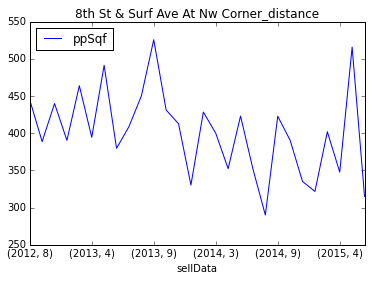

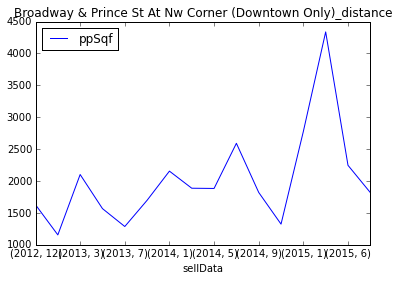

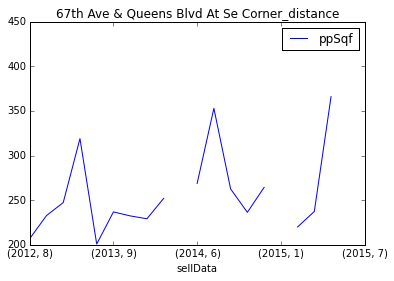

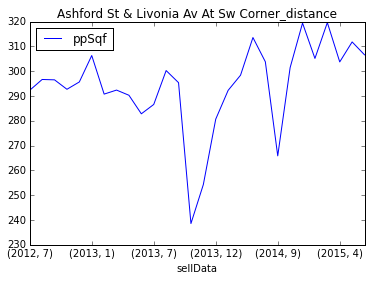

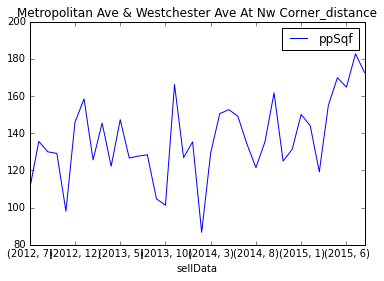

...

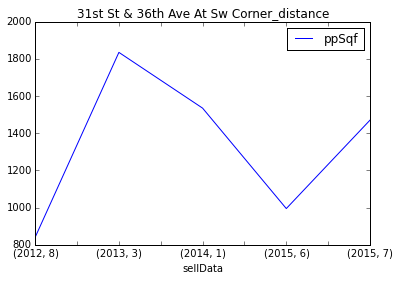

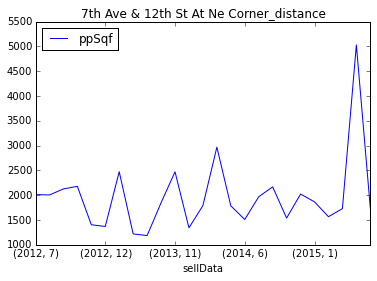

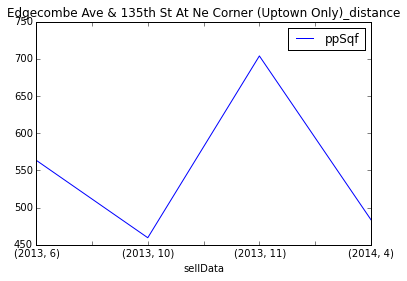

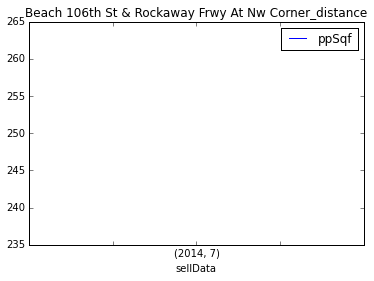

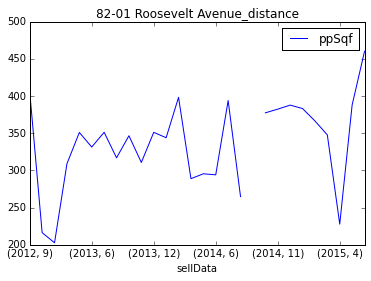

In [11]:
for station in stationFeature.keys():
    stationFeature[station].plot(title = station)

In [12]:
util.pickle_save(fulldata, 'data/fulldata_wClosestStation_9-16.pkl')